In [1]:
import os
import numpy as np
import cv2
import tensorflow as tf
from glob import glob
from skimage import color, io, transform
from tensorflow.keras.utils import Sequence
from tensorflow.keras.layers import Input, Conv2D, UpSampling2D, Concatenate, Softmax
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
import matplotlib.pyplot as plt

In [2]:
# --- Load ab cluster centers (precomputed 313 ab bins from original paper) ---
pts_in_hull = np.load('pts_in_hull.npy')  # shape (313, 2)

In [3]:
# --- Quantization utilities ---
def ab2bin(ab_image):
    ab_flat = ab_image.reshape(-1, 2)
    dists = np.linalg.norm(ab_flat[:, None, :] - pts_in_hull[None, :, :], axis=2)
    labels = np.argmin(dists, axis=1)
    return labels.reshape(ab_image.shape[:2])

In [72]:
def bin2ab(prob_map, T=0.42):
    prob_T = np.exp(np.log(prob_map + 1e-8) / T)
    prob_T /= np.sum(prob_T, axis=-1, keepdims=True)
    ab = np.dot(prob_T, pts_in_hull)  # (H, W, 2)
    return ab

In [ ]:
# --- Preprocessing ---
TARGET_SIZE = 224

def preprocess_image_for_classification(grayscale_path, color_path):
    l_image = io.imread(grayscale_path, as_gray=True)
    l_image = transform.resize(l_image, (TARGET_SIZE, TARGET_SIZE), anti_aliasing=True)[..., np.newaxis]
 
    rgb_image = io.imread(color_path)
    rgb_image = transform.resize(rgb_image, (TARGET_SIZE, TARGET_SIZE), anti_aliasing=True)
    lab = color.rgb2lab(rgb_image)

    l = lab[:, :, 0:1] / 100.0
    ab = lab[:, :, 1:3]
    ab_labels = ab2bin(ab)  # quantized label per pixel

    return l.astype(np.float32), ab_labels.astype(np.int32), rgb_image

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\1729716586.py:26: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 45022 negative Z values that have been clipped to zero
  rgb_output = lab2rgb(lab_combined)


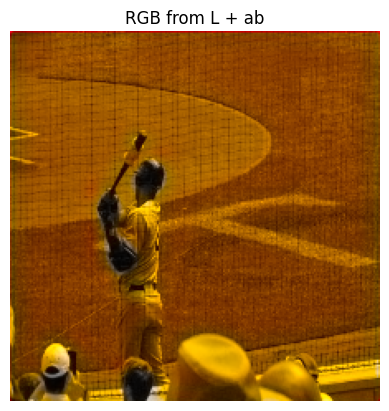

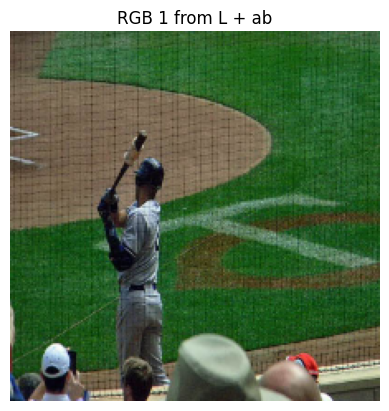

In [73]:
from skimage.color import lab2rgb

BLACK_DIR = "data/train_black"
COLOR_DIR = "data/train_color"
black_dir=BLACK_DIR
color_dir=COLOR_DIR

image_filename = val_filenames[8]

black_image_path = os.path.join(black_dir, image_filename)
color_image_path = os.path.join(color_dir, image_filename)

l, ab, rgb_op =  preprocess_image_for_classification(black_image_path, color_image_path)

l_input = np.expand_dims(l, 0)
pred = model.predict(l_input)[0]  # shape (H, W, 313)
ab1 = bin2ab(pred)

l_input = l[np.newaxis, ...]  # Shape: (1, 224, 224, 1)
ab_pred = model.predict(l_input)[0]  # Shape: (224, 224, 2) for A and B channels

lab_combined = np.concatenate((l * 100.0 , ab1 * 128.0), axis=-1).astype(np.float32)
lab_combined1 = np.concatenate((l * 100.0 , ab_pred * 128.0), axis=-1).astype(np.float32)

# Convert to RGB
rgb_output = lab2rgb(lab_combined)
# rgb_output1 = lab2rgb(lab_combined1)

# Show the image
plt.imshow(rgb_output)
plt.axis("off")
plt.title("RGB from L + ab")
plt.show()

# Show the image
plt.imshow(rgb_op)
plt.axis("off")
plt.title("RGB 1 from L + ab")
plt.show()

In [8]:
# --- Data Generator ---
class ClassificationColorizationDataGenerator(Sequence):
    def __init__(self, black_dir, color_dir, filenames, batch_size=16, shuffle=True):
        self.black_dir = black_dir
        self.color_dir = color_dir
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.image_filenames = filenames
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.image_filenames) / self.batch_size))

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.image_filenames)

    def __getitem__(self, idx):
        batch_filenames = self.image_filenames[idx * self.batch_size: (idx + 1) * self.batch_size]
        l_batch = []
        label_batch = []

        for filename in batch_filenames:
            try:
                l, ab_labels, _ = preprocess_image_for_classification(
                    os.path.join(self.black_dir, filename),
                    os.path.join(self.color_dir, filename)
                )
                l_batch.append(l)
                label_batch.append(ab_labels)
            except Exception as e:
                continue

        l_batch = np.array(l_batch)
        label_batch = np.array(label_batch)
        label_batch = tf.one_hot(label_batch, 313)  # shape: (B, H, W, 313)

        return l_batch, label_batch

In [11]:
# --- Model Definition ---
def build_classification_model():
    input_l = Input(shape=(224, 224, 1))
    x = Conv2D(64, 3, activation='relu', padding='same')(input_l)
    x = Conv2D(64, 3, activation='relu', padding='same')(x)
    x = Conv2D(64, 3, strides=2, padding='same', activation='relu')(x)

    x = Conv2D(128, 3, activation='relu', padding='same')(x)
    x = Conv2D(128, 3, strides=2, padding='same', activation='relu')(x)

    x = Conv2D(256, 3, activation='relu', padding='same')(x)
    x = Conv2D(256, 3, strides=2, padding='same', activation='relu')(x)

    x = UpSampling2D()(x)
    x = Conv2D(256, 3, activation='relu', padding='same')(x)
    x = UpSampling2D()(x)
    x = Conv2D(128, 3, activation='relu', padding='same')(x)
    x = UpSampling2D()(x)
    x = Conv2D(64, 3, activation='relu', padding='same')(x)

    output = Conv2D(313, 1, padding='same')(x)
    output = Softmax()(output)

    return Model(input_l, output)

In [12]:
# --- Training ---
BLACK_DIR = 'data/train_black'
COLOR_DIR = 'data/train_color'
filenames = [f for f in os.listdir(BLACK_DIR) if os.path.isfile(os.path.join(COLOR_DIR, f))]
train_filenames, val_filenames = train_test_split(filenames, test_size=0.1, random_state=42)

train_gen = ClassificationColorizationDataGenerator(BLACK_DIR, COLOR_DIR, train_filenames)
val_gen = ClassificationColorizationDataGenerator(BLACK_DIR, COLOR_DIR, val_filenames, shuffle=False)

model = build_classification_model()
model.compile(optimizer='adam', loss='categorical_crossentropy')
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 64)   │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 28, 28, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 56, 56, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 112, 112, 256)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 112, 112, 128)  │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 224, 224, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 224, 224, 64)   │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 224, 224, 313)  │        20,345 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ softmax (Softmax)               │ (None, 224, 224, 313)  │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,160,441 (8.24 MB)

 Trainable params: 2,160,441 (8.24 MB)

 Non-trainable params: 0 (0.00 B)

In [102]:
model.fit(train_gen, validation_data=val_gen, epochs=1,
          callbacks=[ModelCheckpoint("model_classification1.keras", save_best_only=True),
                     ReduceLROnPlateau(patience=3)])

282/282 [==============================] - 2970s 11s/step - loss: 3.1292 - val_loss: 3.0099 - lr: 0.0010


In [27]:
import os
print("Current working directory:", os.getcwd())
print(os.path.getsize("model_classification1.keras"))

Current working directory: c:\Users\nksgb\OneDrive\Documents\ML\DL\final
26032964


In [29]:
from tensorflow.keras.models import load_model

model = load_model("my_model2.keras", compile=False)  # use compile=True if you saved with loss/metrics
# model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [33]:
# --- Prediction + Annealed Mean Decoding ---
def predict_and_show(image_filename):
    l, _, original = preprocess_image_for_classification(
        os.path.join(BLACK_DIR, image_filename),
        os.path.join(COLOR_DIR, image_filename))
    l_input = np.expand_dims(l, 0)
    pred = model.predict(l_input)[0]  # shape (H, W, 313)
    ab = bin2ab(pred)
    lab_image = np.concatenate([l * 100.0, ab * 256.0], axis=-1)
    rgb_output = color.lab2rgb(lab_image.astype(np.float32))

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(original)
    plt.title("Original")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(l[:, :, 0], cmap='gray')
    plt.title("Grayscale")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(rgb_output)
    plt.title("Colorized")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

c:\ProgramData\Anaconda3\lib\site-packages\skimage\color\colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 82 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


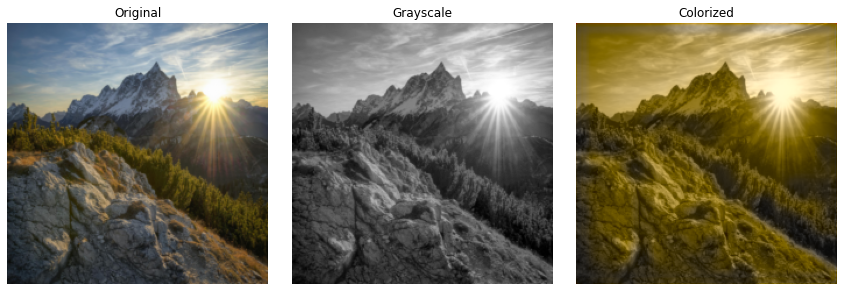

In [95]:
predict_and_show("mt.jpg")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 958ms/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 48232 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


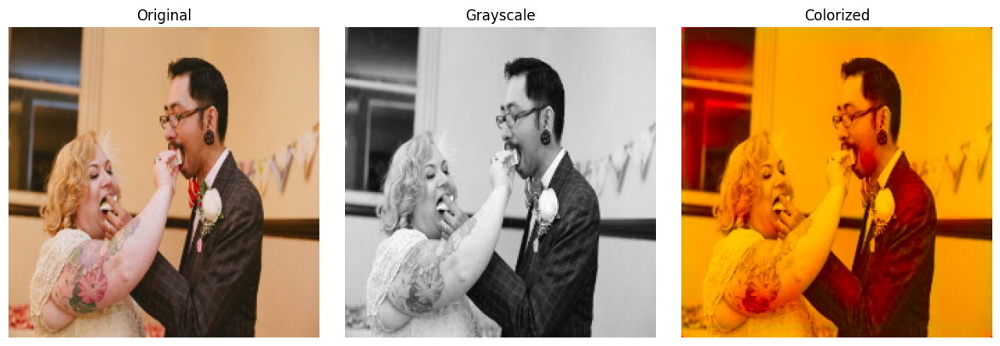

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 40032 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


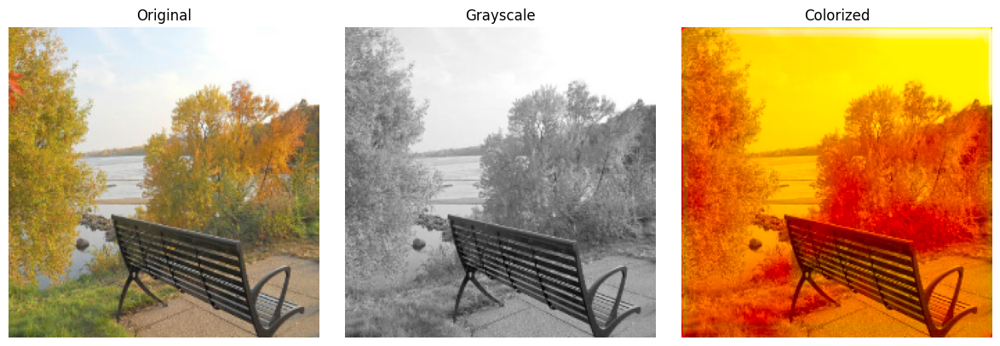

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 48498 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


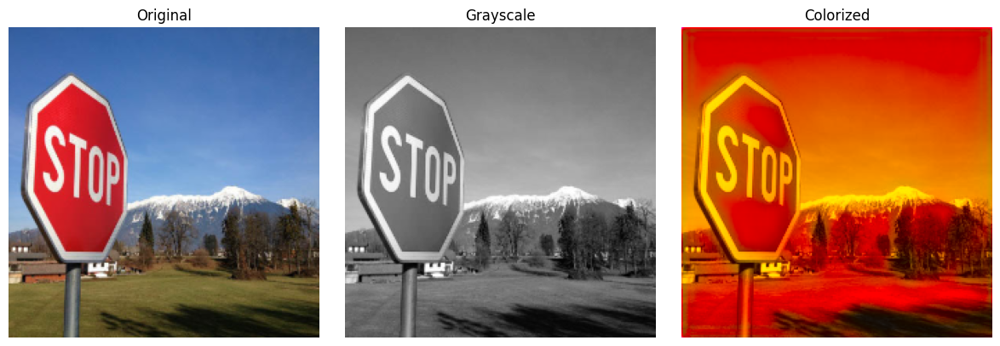

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 13765 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


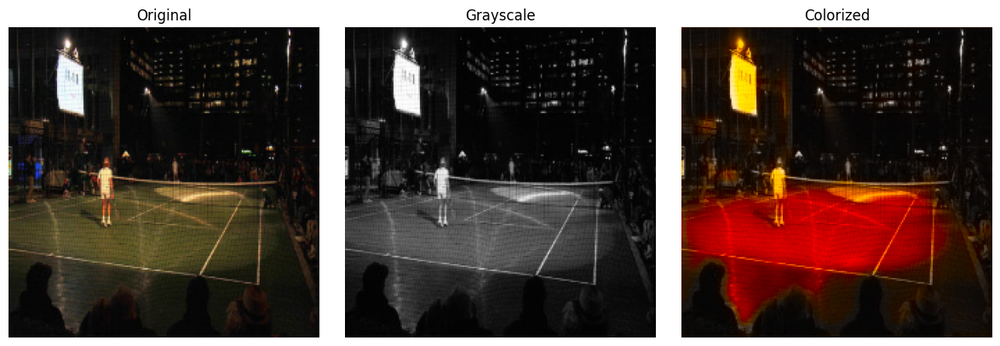

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 37939 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


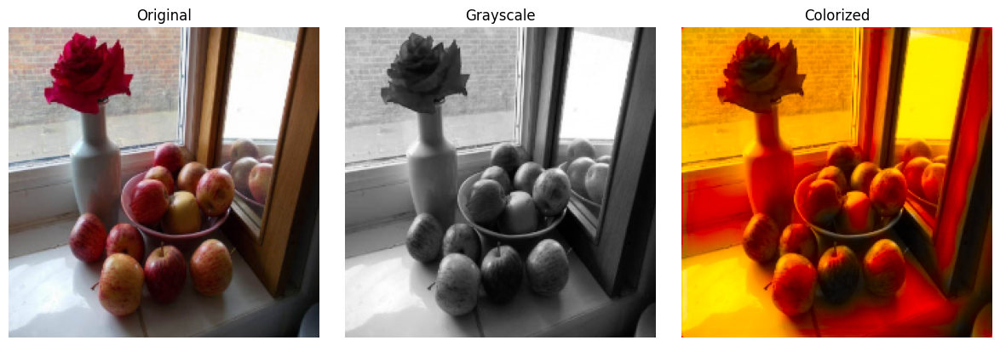

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 37376 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


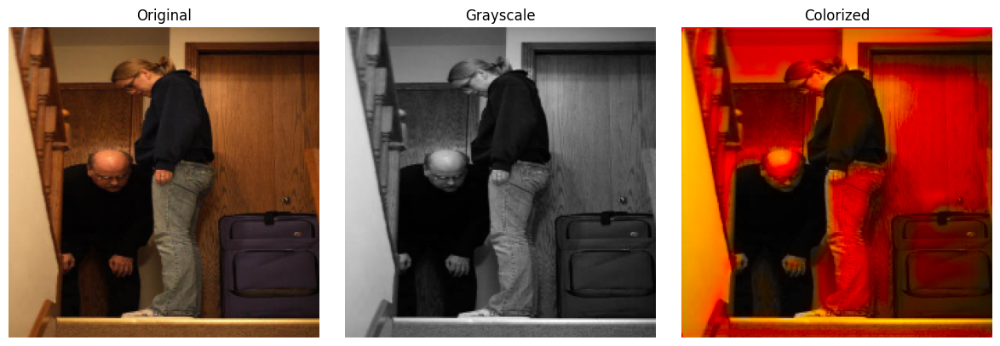

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 38130 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


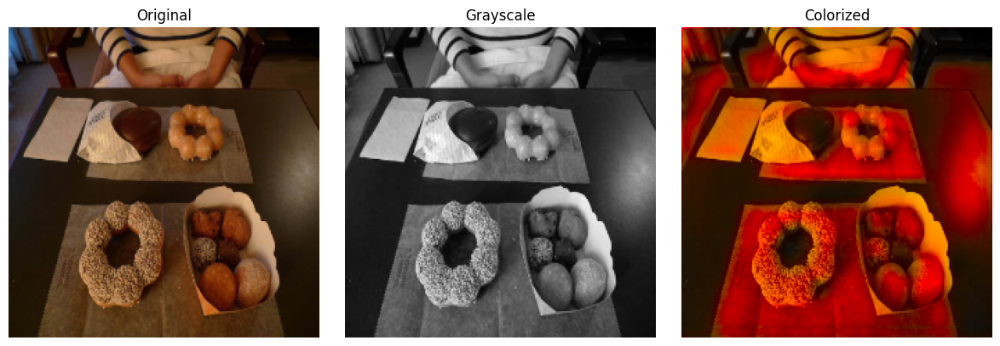

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 48787 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


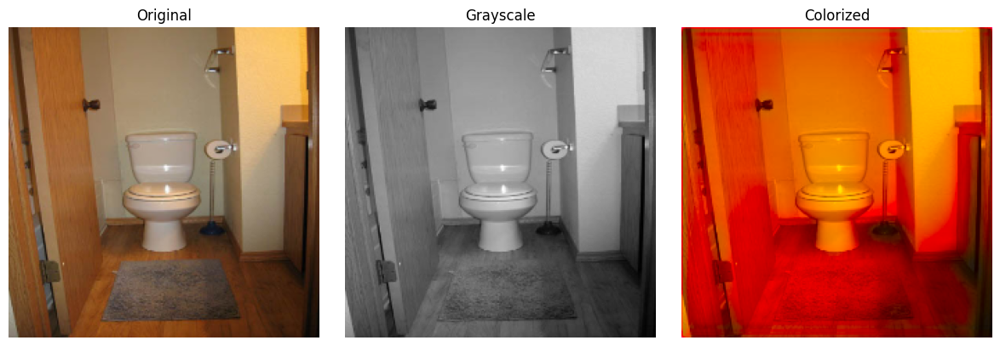

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 991ms/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 48937 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


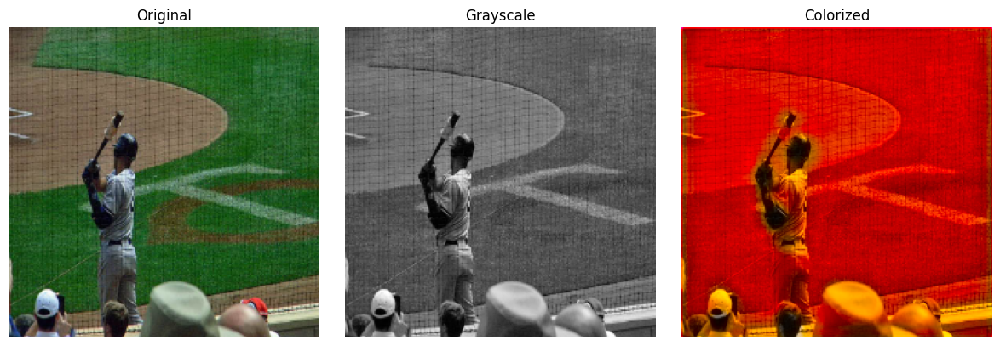

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 45416 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


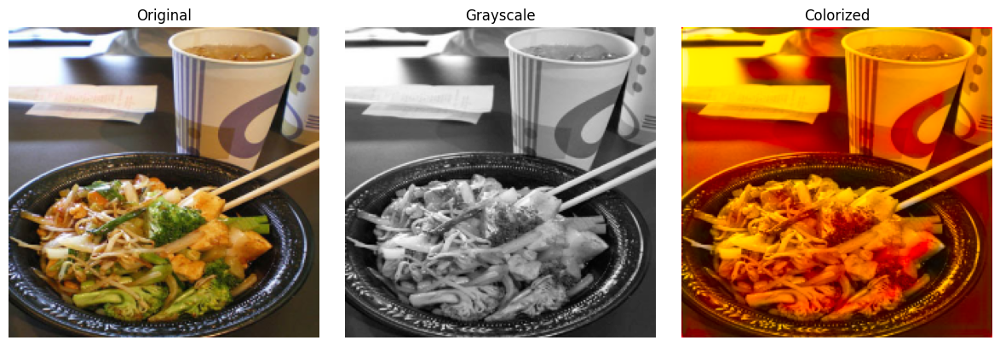

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 979ms/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 41415 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


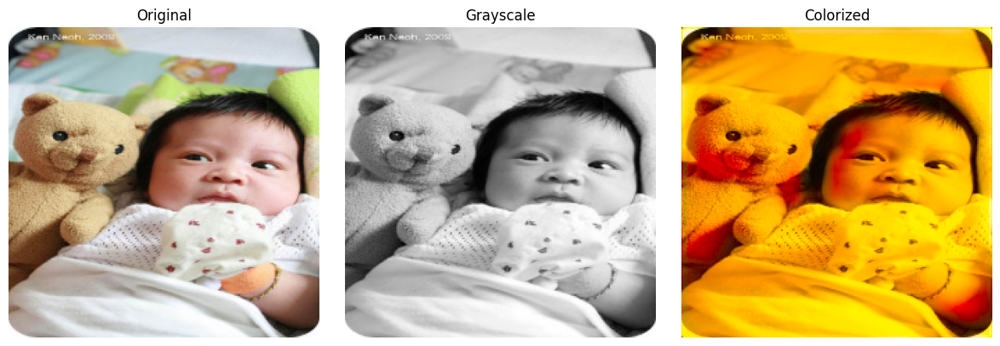

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 14721 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


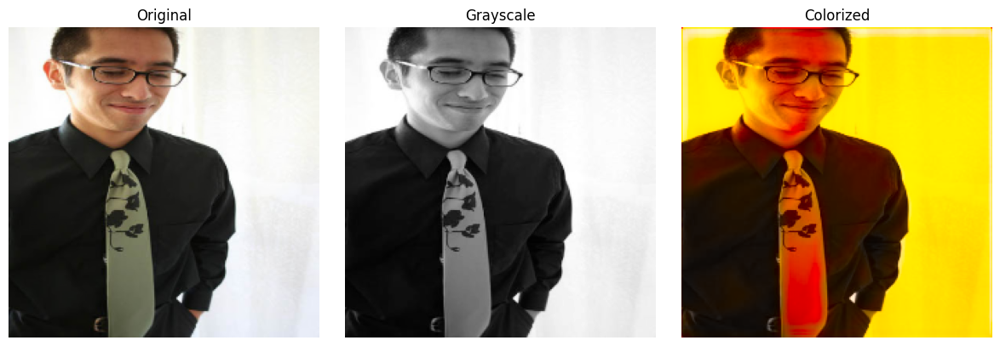

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 40608 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


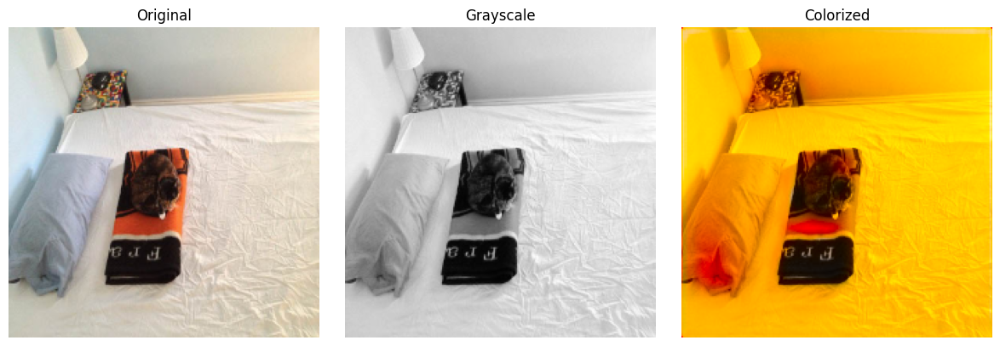

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 41780 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


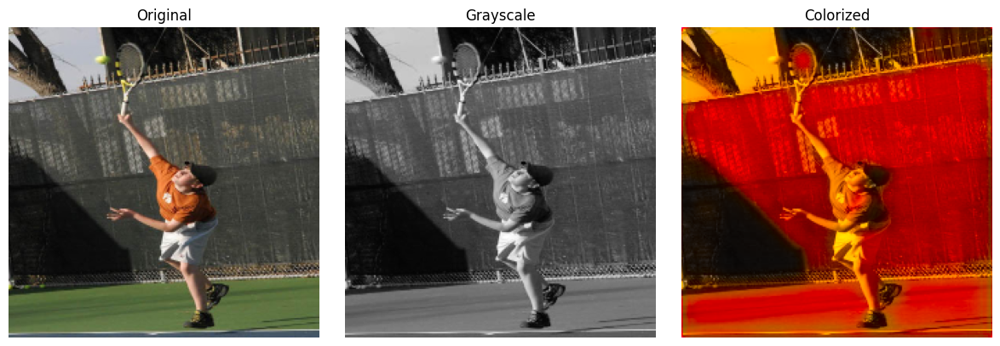

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 34140 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


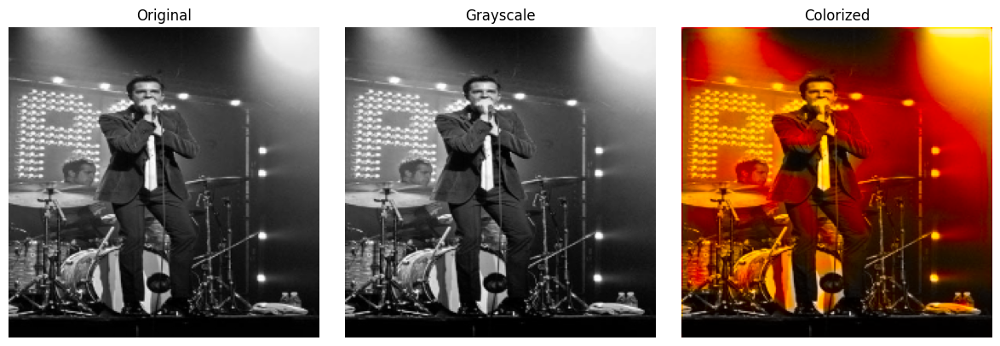

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 981ms/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 47554 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


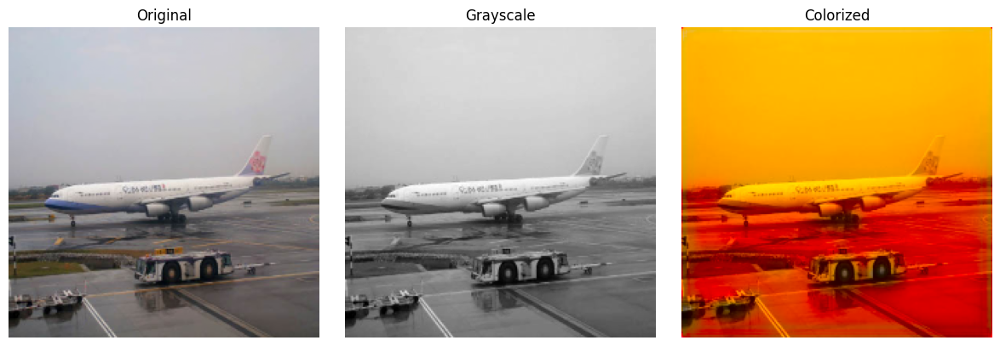

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 48163 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


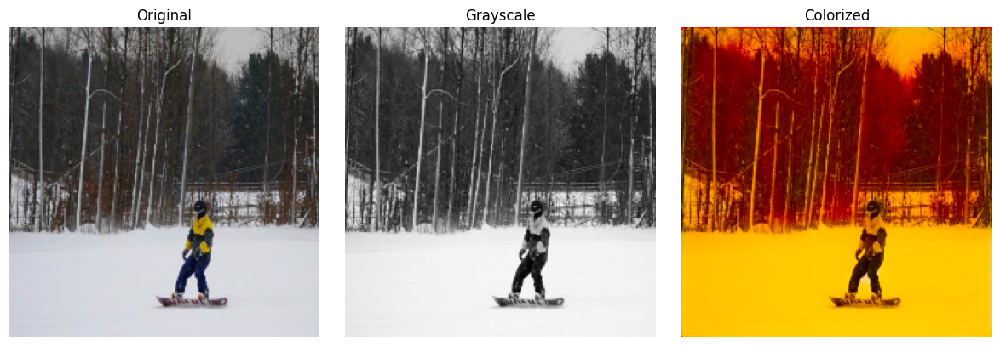

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 49810 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


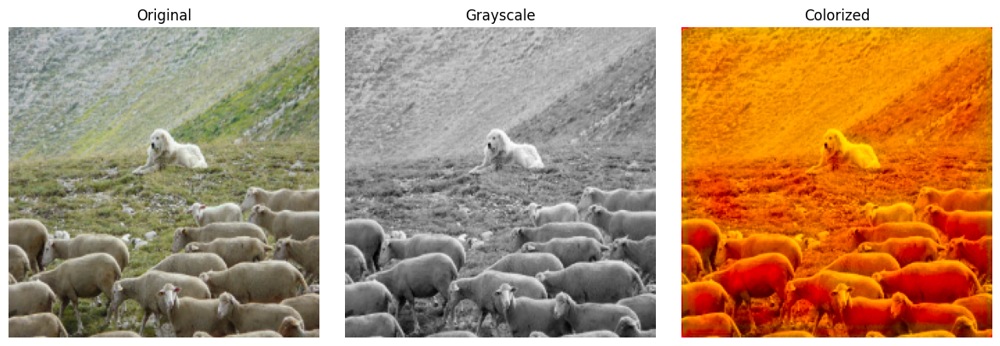

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 50169 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


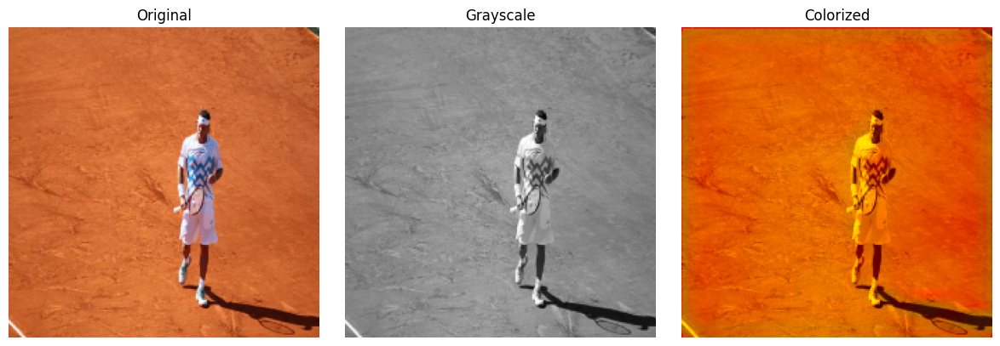

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


C:\Users\nksgb\AppData\Local\Temp\ipykernel_22328\2897294749.py:10: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 50176 negative Z values that have been clipped to zero
  rgb_output = color.lab2rgb(lab_image.astype(np.float32))


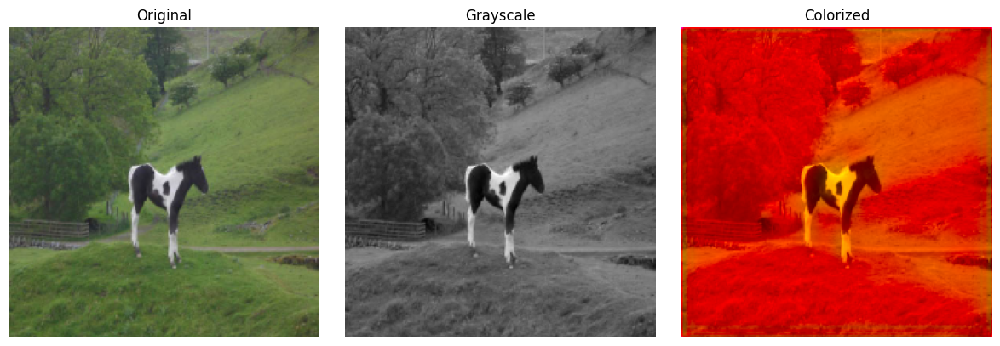

In [64]:
for i in range(20):
  predict_and_show(val_filenames[i])